Dataset tersedia di: https://www.kaggle.com/kushalvala/concrete ; http://archive.ics.uci.edu/ml/datasets/concrete+compressive+strength

Concrete Compressive Strength 

---------------------------------

Abstract: Concrete is the most important material in civil engineering. The 
concrete compressive strength is a highly nonlinear function of age and 
ingredients. These ingredients include cement, blast furnace slag, fly ash, 
water, superplasticizer, coarse aggregate, and fine aggregate.


In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler

In [2]:
def load_data(filename):
    df = pd.read_csv(filename)
    return df

In [3]:
df = load_data('Concrete.csv')

### Statistics summary

independen = cement, slag, flyash, water, superplasticizer coarseaggregate, fineaggregate, age

dependen = csMPa

In [4]:
df.shape

(1030, 9)

In [5]:
# melihat 5 baris terakhir dari data.

df.tail()

,cement,slag,flyash,water,superplasticizer,coarseaggregate,fineaggregate,age,csMPa
1025,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28,44.28
1026,322.2,0.0,115.6,196.0,10.4,817.9,813.4,28,31.18
1027,148.5,139.4,108.6,192.7,6.1,892.4,780.0,28,23.70
1028,159.1,186.7,0.0,175.6,11.3,989.6,788.9,28,32.77
1029,260.9,100.5,78.3,200.6,8.6,864.5,761.5,28,32.40


In [6]:
# dengan .info() dapat diketahui record data dan keseluruhan record data sudah dalam format numerik
# melihat informasi data kita mulai dari jumlah data, tipe data, memory yang digunakan dll

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1030 entries, 0 to 1029
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   cement            1030 non-null   float64
 1   slag              1030 non-null   float64
 2   flyash            1030 non-null   float64
 3   water             1030 non-null   float64
 4   superplasticizer  1030 non-null   float64
 5   coarseaggregate   1030 non-null   float64
 6   fineaggregate     1030 non-null   float64
 7   age               1030 non-null   int64  
 8   csMPa             1030 non-null   float64
dtypes: float64(8), int64(1)
memory usage: 72.5 KB


In [7]:
# melihat statistical description dari data mulai dari mean, kuartil, standard deviation dll.

df.describe()

,cement,slag,flyash,water,superplasticizer,coarseaggregate,fineaggregate,age,csMPa
count,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000,1030.000000
mean,281.167864,73.895825,54.188350,181.567282,6.204660,972.918932,773.580485,45.662136,35.817961
std,104.506364,86.279342,63.997004,21.354219,5.973841,77.753954,80.175980,63.169912,16.705742
min,102.000000,0.000000,0.000000,121.800000,0.000000,801.000000,594.000000,1.000000,2.330000
25%,192.375000,0.000000,0.000000,164.900000,0.000000,932.000000,730.950000,7.000000,23.710000
50%,272.900000,22.000000,0.000000,185.000000,6.400000,968.000000,779.500000,28.000000,34.445000
75%,350.000000,142.950000,118.300000,192.000000,10.200000,1029.400000,824.000000,56.000000,46.135000
max,540.000000,359.400000,200.100000,247.000000,32.200000,1145.000000,992.600000,365.000000,82.600000


# DATA PREPARATION

* Memeriksa dan menangani jika ada nilai yang hilang // missing value 

### Missing Values

In [8]:
# mengecek data null

df.isna().any()

cement              False
slag                False
flyash              False
water               False
superplasticizer    False
coarseaggregate     False
fineaggregate       False
age                 False
csMPa               False
dtype: bool

# DATA EXPLORATORY & VISUALIZATION
lebih mengenal data dan menemukan insights dari data

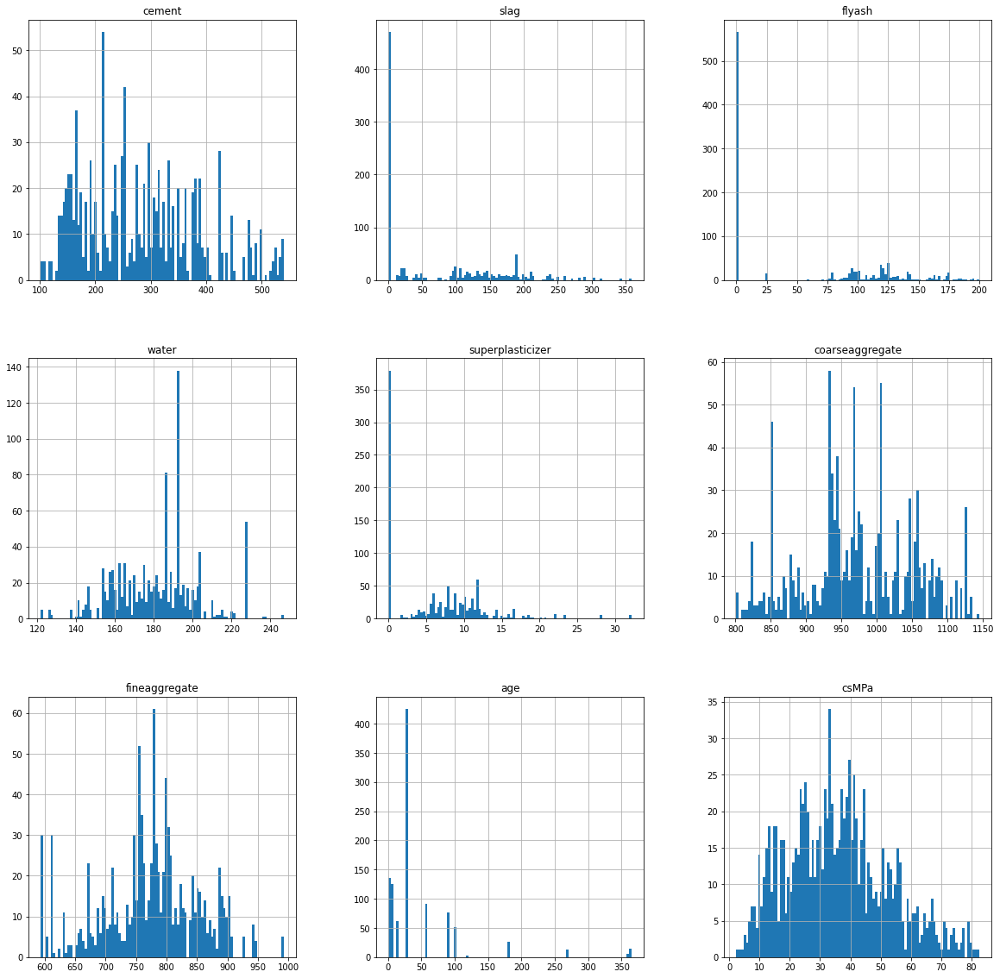

In [9]:
df.hist(bins=100, figsize=(20,20))
plt.show()

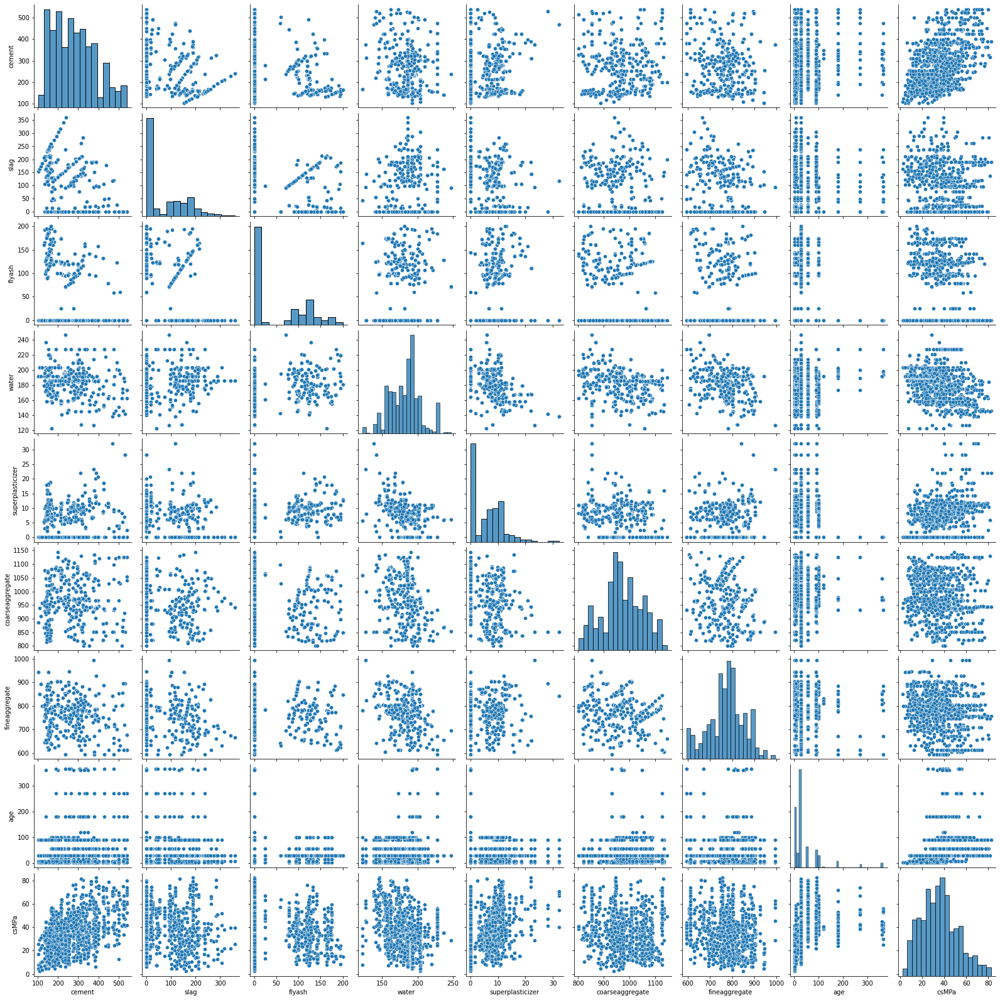

In [10]:
sns.pairplot(df)
plt.show()

### tidak ada krelasi yang tinggi antara independen variabel (feature)

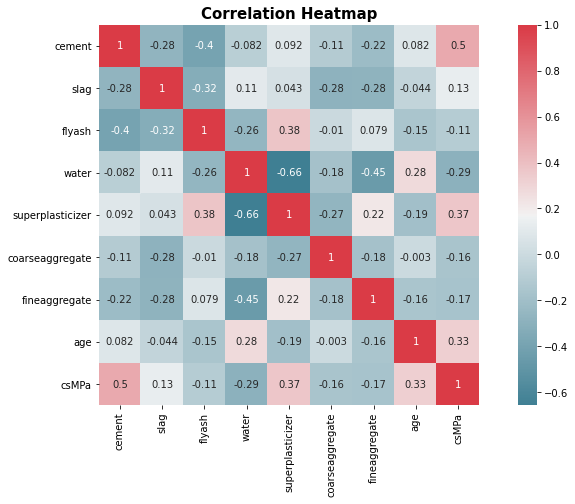

In [11]:
# memeriksa nilai yang sangat berkorelasi (strong // highly corelation) 

plt.figure(figsize = (14,7))
sns.heatmap(df.corr(), 
            annot = True, 
            square = True, 
            cmap = sns.diverging_palette(220, 10, as_cmap=True))
plt.title('Correlation Heatmap', fontweight='bold', fontsize=15)
plt.show()

Tidak ada korelasi yang tinggi antara csMPa dan fitur lain kecuali untuk cement, yang  menjadi sebab untuk kekuatan lebih. semen > makin kuat
age dan superplasticizer adalah dua fitur lainnya yang berkorelasi kuat dengan csMPa.
superplasticizer tampaknya memiliki korelasi tinggi negatif dengan water, korelasi positif dengan flyash dan fineagregat.

In [12]:
# list untuk memisahkan numeric dan categorial variabel berdasarkan tipe data

num = []
cat = []

for col in df.columns: 
    if df[col].dtype == 'O':
        cat.append(col)
    else: 
        num.append(col)

print('categorial ' + repr(cat))
print('numeric ' + repr(num))

categorial []
numeric ['cement', 'slag', 'flyash', 'water', 'superplasticizer', 'coarseaggregate', 'fineaggregate', 'age', 'csMPa']


In [13]:
num_data = df[num]


C:\Users\latifa\AppData\Local\Programs\Python\Python38-32\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\latifa\AppData\Local\Programs\Python\Python38-32\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\latifa\AppData\Local\Programs\Python\Python38-32\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit key

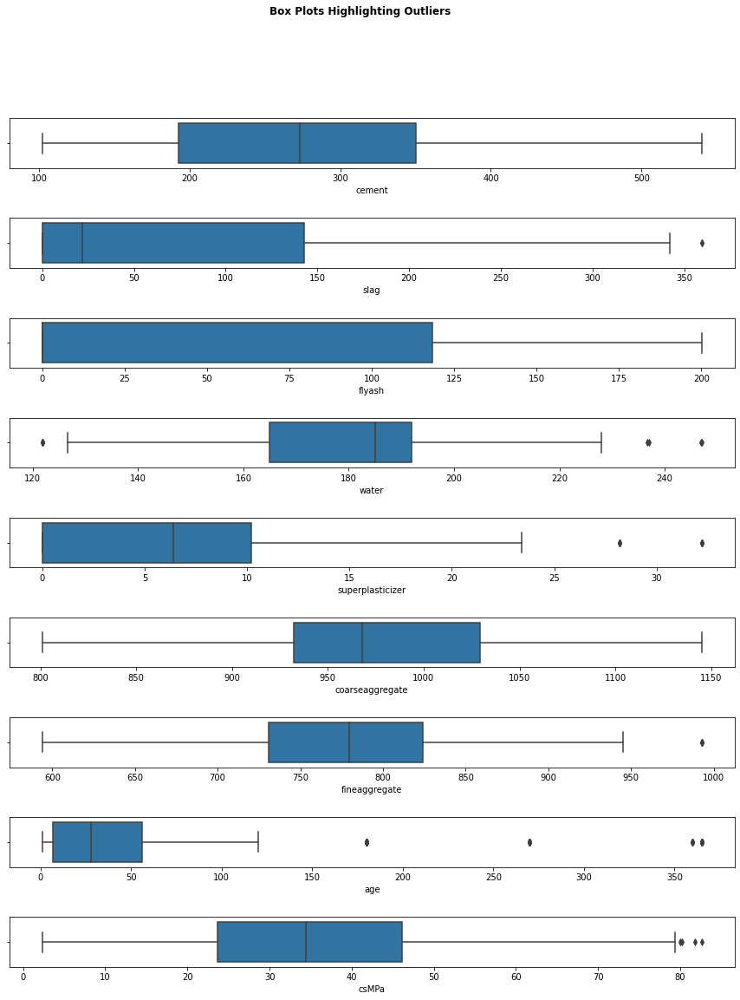

In [14]:
# create a box plot for each continuous variable

nrows = len(num)
fig, axes = plt.subplots(ncols=1, 
                         nrows=nrows, 
                         figsize=(15,nrows*2))
plt.subplots_adjust(hspace=1)

for i, var in enumerate(num):
    sns.boxplot(num_data[var], orient='h', ax=axes[i])

fig.suptitle('Box Plots Highlighting Outliers', fontweight='bold')
plt.show()

Di sini Data tidak terdistribusi normal yang berarti kita dapat menggunakan Jangkauan Interkuartil untuk mengukur batas

In [15]:
IQR = df.quantile(0.75) - df.quantile(0.25)
IQR

cement              157.625
slag                142.950
flyash              118.300
water                27.100
superplasticizer     10.200
coarseaggregate      97.400
fineaggregate        93.050
age                  49.000
csMPa                22.425
dtype: float64

In [16]:
lower_bridge = df.quantile(0.25) - (IQR*1.5)
upper_bridge = df.quantile(0.75) + (IQR*1.5)

print(lower_bridge)
print(upper_bridge)

cement              -44.0625
slag               -214.4250
flyash             -177.4500
water               124.2500
superplasticizer    -15.3000
coarseaggregate     785.9000
fineaggregate       591.3750
age                 -66.5000
csMPa                -9.9275
dtype: float64
cement               586.4375
slag                 357.3750
flyash               295.7500
water                232.6500
superplasticizer      25.5000
coarseaggregate     1175.5000
fineaggregate        963.5750
age                  129.5000
csMPa                 79.7725
dtype: float64


In [17]:
lower_bridge = df.quantile(0.25) - (IQR*3)
upper_bridge = df.quantile(0.75) + (IQR*3)

In [18]:
df.loc[df['age'] >= 150,'age'] = 150

{'whiskers': [<matplotlib.lines.Line2D at 0x15096d18>,
 'caps': [<matplotlib.lines.Line2D at 0x15096910>,
 'boxes': [<matplotlib.lines.Line2D at 0x15096f58>],
 'medians': [<matplotlib.lines.Line2D at 0x15096040>],
 'fliers': [<matplotlib.lines.Line2D at 0x15096f28>],
 'means': []}

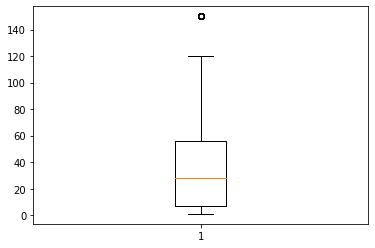

In [19]:
plt.boxplot(df['age'])

In [20]:
df.loc[df['superplasticizer'] >= 25,'superplasticizer'] = 25

{'whiskers': [<matplotlib.lines.Line2D at 0x14a441a8>,
 'caps': [<matplotlib.lines.Line2D at 0x14a448b0>,
 'boxes': [<matplotlib.lines.Line2D at 0x14a44ce8>],
 'medians': [<matplotlib.lines.Line2D at 0x14a44358>],
 'fliers': [<matplotlib.lines.Line2D at 0x13bba1a8>],
 'means': []}

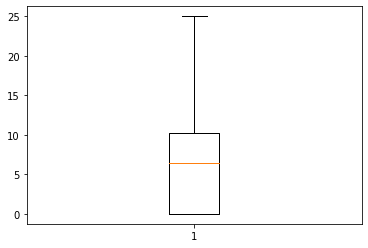

In [21]:
plt.boxplot(df['superplasticizer'])

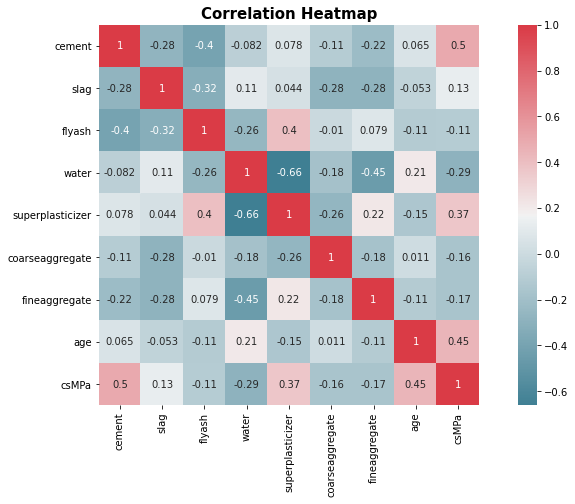

In [22]:
# memeriksa nilai yang sangat berkorelasi setelah dilakukan handling outlier

plt.figure(figsize = (14,7))
sns.heatmap(df.corr(), 
            annot = True, 
            square = True, 
            cmap = sns.diverging_palette(220, 10, as_cmap=True))
plt.title('Correlation Heatmap', fontweight='bold', fontsize=15)
plt.show()

Dari hasil korelasi antar variabel terdapat korelasi yaang tinggi sekitar .4 - .5 yang cukup tinggi
jadi, variabel yang digunakan adalah cement, superplasticizer, dan age

# Linear Regression

Text(0.5, 1.0, 'Plot csMPa vs cement')

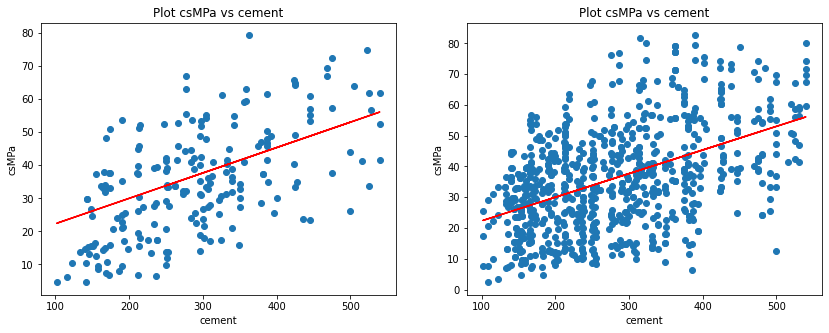

In [23]:
# cement
X = df['cement'].values.reshape(-1, 1)
y = df['csMPa'].values.reshape(-1, 1)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

reg = LinearRegression()
reg.fit(X_train, y_train)

#scatter plot of test set
plt.figure(figsize=(14,5))
plt.subplot(1,2,1)

y_pred_a = reg.predict(X_test)
plt.scatter(X_test, y_test)
plt.plot(X_test, y_pred_a, c='r')
plt.xlabel('cement')
plt.ylabel('csMPa')
plt.title('Plot csMPa vs cement')
plt.subplot(1,2,2)

# scatter plot of train set

y_pred_b = reg.predict(X_train)
plt.scatter(X_train, y_train)
plt.plot(X_train, y_pred_b, c='r')
plt.xlabel('cement')
plt.ylabel('csMPa')
plt.title('Plot csMPa vs cement')

In [24]:
reg.predict([[100]])

array([[22.33837521]])

Text(0.5, 1.0, 'Plot csMPa vs age')

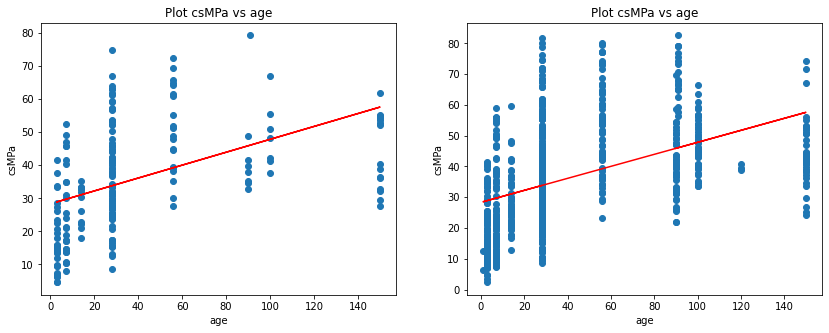

In [25]:
# age

X_age = df['age'].values.reshape(-1, 1)
y_age = df['csMPa'].values.reshape(-1, 1)

X_age_train, X_age_test, y_age_train, y_age_test = train_test_split(X_age, y_age, test_size = 0.2, random_state = 0)
reg_age = LinearRegression()

reg_age.fit(X_age_train, y_age_train)

#scatter plot of test set

plt.figure(figsize=(14,5))
plt.subplot(1,2,1)
y_age_pred_a = reg_age.predict(X_age_test)
plt.scatter(X_age_test, y_age_test)
plt.plot(X_age_test, y_age_pred_a, c='r')
plt.xlabel('age')
plt.ylabel('csMPa')
plt.title('Plot csMPa vs age')

# scatter plot of training set

plt.subplot(1,2,2)

y_age_pred_b = reg_age.predict(X_age_train)
plt.scatter(X_age_train, y_age_train)
plt.plot(X_age_train, y_age_pred_b, c='r')
plt.xlabel('age')
plt.ylabel('csMPa')
plt.title('Plot csMPa vs age')

Text(0.5, 1.0, 'Plot csMPa vs superplasticizer')

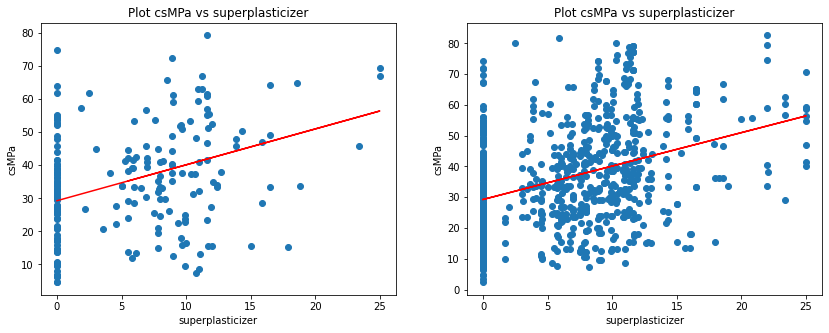

In [26]:
# superplasticizer

X_superplasticizer = df['superplasticizer'].values.reshape(-1, 1)
y_superplasticizer = df['csMPa'].values.reshape(-1, 1)

X_superplasticizer_train, X_superplasticizer_test, y_superplasticizer_train, y_superplasticizer_test = train_test_split(X_superplasticizer, y_superplasticizer, test_size = 0.2, random_state = 0)

reg_superplasticizer = LinearRegression()
reg_superplasticizer.fit(X_superplasticizer_train, y_superplasticizer_train)

#scatter plot of test set

plt.figure(figsize=(14,5))
plt.subplot(1,2,1)

y_superplasticizer_pred_a = reg_superplasticizer.predict(X_superplasticizer_test)
plt.scatter(X_superplasticizer_test, y_superplasticizer_test)
plt.plot(X_superplasticizer_test, y_superplasticizer_pred_a, c='r')
plt.xlabel('superplasticizer')
plt.ylabel('csMPa')
plt.title('Plot csMPa vs superplasticizer')

# scatter plot of train set

plt.subplot(1,2,2)


y_superplasticizer_pred_b = reg_superplasticizer.predict(X_superplasticizer_train)
plt.scatter(X_superplasticizer_train, y_superplasticizer_train)
plt.plot(X_superplasticizer_train, y_superplasticizer_pred_b, c='r')
plt.xlabel('superplasticizer')
plt.ylabel('csMPa')
plt.title('Plot csMPa vs superplasticizer')

In [27]:
## Evaluasi Permodelan Regresi

cement score: 0.322215
age score: 0.179899
superplasticizer score: 0.101813



print("cement score: %f" % (reg.score(X_test, y_test)))
print("age score: %f" % (reg_age.score(X_age_test, y_age_test)))
print("superplasticizer score: %f" % (reg_superplasticizer.score(X_superplasticizer_test, y_superplasticizer_test)))


In [28]:
print("cement intercept: %f" % (reg.intercept_))
print("cement coef: %f" % (reg.coef_))

print("age intercept: %f" % (reg_age.intercept_))
print("age coef: %f" % (reg_age.coef_))

print("superplasticizer intercept: %f" % (reg_superplasticizer.intercept_))
print("superplasticizer coef: %f" % (reg_superplasticizer.coef_))


cement intercept: 14.663991
cement coef: 0.076744
age intercept: 28.348053
age coef: 0.194950
superplasticizer intercept: 29.288678
superplasticizer coef: 1.085315


In [29]:
def show_metrics(y_test, y_pred):
    '''
    print the mse , mae and mape metric
    '''
    mse = np.mean((y_test - y_pred) ** 2)
    mae = np.mean(np.fabs(y_test - y_pred))
    rmse = np.sqrt(mse)
    mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100
    RSS = np.sum((y_pred - y_test) ** 2)
    TSS = np.sum((y_test - np.mean(y_test)) ** 2)
    r2 = 1 - (RSS / TSS)



    print("RMSE: %f" % (mse))
    print("MSE: %f" % (rmse))
    print("MAE: %f" % (mae))
    print("MAPE: %f"%(mape))
    print("R2SCORE: %f"%(r2))
    print()

In [30]:
print("cement metric") 
show_metrics(y_test, y_pred_a)

cement metric
RMSE: 178.514646
MSE: 13.360937
MAE: 11.245138
MAPE: 53.375020
R2SCORE: 0.322215



In [31]:
print("age metric") 
show_metrics(y_age_test, y_age_pred_a)

age metric
RMSE: 215.998028
MSE: 14.696871
MAE: 11.883451
MAPE: 54.856042
R2SCORE: 0.179899



In [32]:
print("superplasticizer metric") 
show_metrics(y_superplasticizer_test, y_superplasticizer_pred_a)

superplasticizer metric
RMSE: 236.564264
MSE: 15.380646
MAE: 12.402725
MAPE: 60.137599
R2SCORE: 0.101813



# Multiple Linear Regression

In [58]:
X_ml = df[['cement', 'superplasticizer', 'age']]
y_ml = df['csMPa']

X_ml_train, X_ml_test, y_ml_train, y_ml_test = train_test_split(X_ml, y_ml, test_size = 0.2, random_state = 0)
reg_ml = LinearRegression()
reg_ml.fit(X_ml_train, y_ml_train)


LinearRegression()

In [59]:
reg_ml.predict([[100, 100, 100]])

array([147.10935143])

In [60]:
reg_ml.score(X_ml_test, y_ml_test)

0.6067504161940862

In [61]:
print("cement intercept: %f" % (reg_ml.intercept_))

cement intercept: 1.744957


In [62]:
reg_ml.coef_

array([0.06664504, 1.1769707 , 0.21002821])

In [63]:

y_ml_pred = reg_ml.predict(X_ml_test)

In [64]:
print("ml metric") 
show_metrics(y_ml_test, y_ml_pred)

ml metric
RMSE: 103.573935
MSE: 10.177128
MAE: 7.825144
MAPE: 32.092455
R2SCORE: 0.606750



# Logistic Regression

In [65]:
# df_lg = df[["cement", "superplasticizer", "age", "csMPa"]]


In [66]:
# df_lg.describe().T

In [67]:
pd.cut(df['csMPa'], bins = 5).value_counts()

(18.384, 34.438]    337
(34.438, 50.492]    308
(2.25, 18.384]      178
(50.492, 66.546]    152
(66.546, 82.6]       55
Name: csMPa, dtype: int64

In [68]:
bin = ['sangat lemah', 'lemah', 'sedang', 'kuat', 'sangat kuat']
# cut_bins = [2.25, 18.384, 34.438, 50.492, 66.546, 82.6]

cut_bins = np.linspace(min(df["csMPa"]), max(df["csMPa"]), 6)
df['csMPa_bin'] = pd.cut(df['csMPa'], bins = cut_bins, labels = bin)

In [69]:
# data_lg = df_lg.copy()

cut_bins = [2.25, 18.384, 34.438, 50.492, 66.546, 82.6]

df["csMPa_bin_num"] = pd.cut(df['csMPa'], bins = cut_bins, labels = [1, 2, 3, 4, 5])

In [70]:
df.tail()

,cement,slag,flyash,water,superplasticizer,coarseaggregate,fineaggregate,age,csMPa,csMPa_bin,csMPa_bin_num
1025,276.4,116.0,90.3,179.6,8.9,870.1,768.3,28,44.28,sedang,3
1026,322.2,0.0,115.6,196.0,10.4,817.9,813.4,28,31.18,lemah,2
1027,148.5,139.4,108.6,192.7,6.1,892.4,780.0,28,23.70,lemah,2
1028,159.1,186.7,0.0,175.6,11.3,989.6,788.9,28,32.77,lemah,2
1029,260.9,100.5,78.3,200.6,8.6,864.5,761.5,28,32.40,lemah,2


In [71]:
df.shape

(1030, 11)

In [72]:
df['csMPa_bin_num'].value_counts()

2    337
3    308
1    178
4    152
5     55
Name: csMPa_bin_num, dtype: int64

In [73]:
X_lg = df[["cement", "superplasticizer", "age"]]
y_lg = df['csMPa_bin_num']

In [74]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_lg)
scaled_data = scaler.transform(X_lg)
scaled_data = pd.DataFrame(scaled_data, columns = X_lg.columns)
scaled_data.head()

,cement,superplasticizer,age
0,2.477915,-0.631813,-0.288748
1,2.477915,-0.631813,-0.288748
2,0.491425,-1.064067,2.844046
3,0.491425,-1.064067,2.844046
4,-0.790459,-1.064067,2.844046


In [75]:
X_lg_train, X_lg_test, y_lg_train, y_lg_test = train_test_split(X_lg, y_lg, test_size=0.2, random_state=0)

In [76]:
reg_lg = LogisticRegression()
reg_lg.fit(X_lg_train, y_lg_train)

C:\Users\latifa\AppData\Local\Programs\Python\Python38-32\lib\site-packages\sklearn\linear_model\_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [77]:
reg_lg.score(X_lg_test, y_lg_test)

0.38349514563106796

In [78]:
reg_lg.intercept_

array([ 0.14671009,  0.1770994 , -0.04494286, -0.16174313, -0.1171235 ])

In [79]:
reg_lg.coef_


array([[ 0.00229736, -0.07338512, -0.03052471],
       [ 0.00145321, -0.01213461,  0.00150421],
       [-0.000727  ,  0.0382925 ,  0.0168269 ],
       [-0.00059319,  0.02015659,  0.01058094],
       [-0.00243039,  0.02707064,  0.00161266]])

In [80]:
# sns.pairplot(df, hue="csMPa_bin_num")
# plt.show()